# Medical Imaging Coursework 25/26

*Harvey Bermingham*

### Development and Testing Notebook

The notebook below is used to for the testing and development of scripts, this is NOT my response to the questions however, that is included in the report.

In [2]:
%load_ext autoreload
%autoreload 2

from med_im import module_1
from med_im import module_2

## Module 1

### Exercise 1.1 (a)

Image shape: (512, 512)
Min value: 0.0
Max value: 0.001


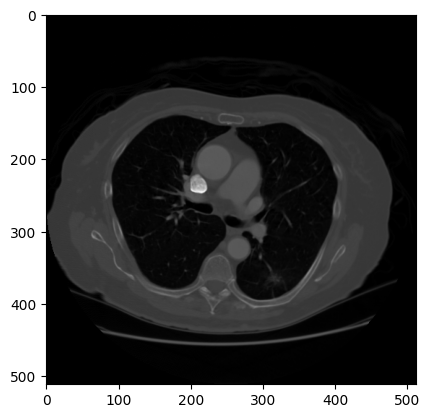

In [4]:
image = module_1.image_outputs()


### Exercise 1.1 (b)

SimulateGaussian(𝜇= 0, 𝜎= 0.05) and Poisson noise atthree different levels (𝐼0 ∈ [105,103,102]). Simulate these sinograms at different total number of angles, 360, 90, 20.

/Users/harvey/Documents/Cambridge/Medical Imaging/Coursework/hb747/med_im_env/lib/python3.12/site-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


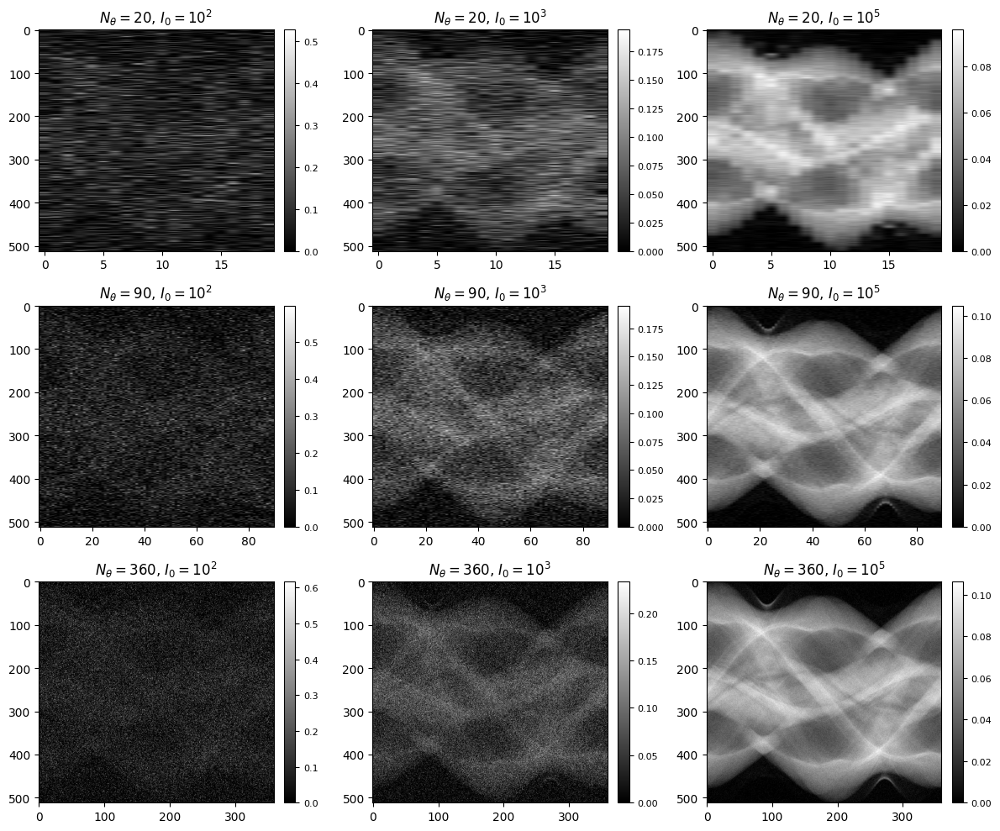

In [7]:
noisy_sinogram_dict = module_1.create_noisy_sinograms(image)
module_1.plot_sinogram_dict(noisy_sinogram_dict)

### Exercise 1.1 (c)

Reconstruct all sinograms,first with FBP, and then Gradient Descent. What is the performance? When do they do better or worse? Display reconstruction error and image quality metrics and do a comparative analysis. What does eachs canning procedure and algorithmmean in clinical practice for the patients? what are their impact?

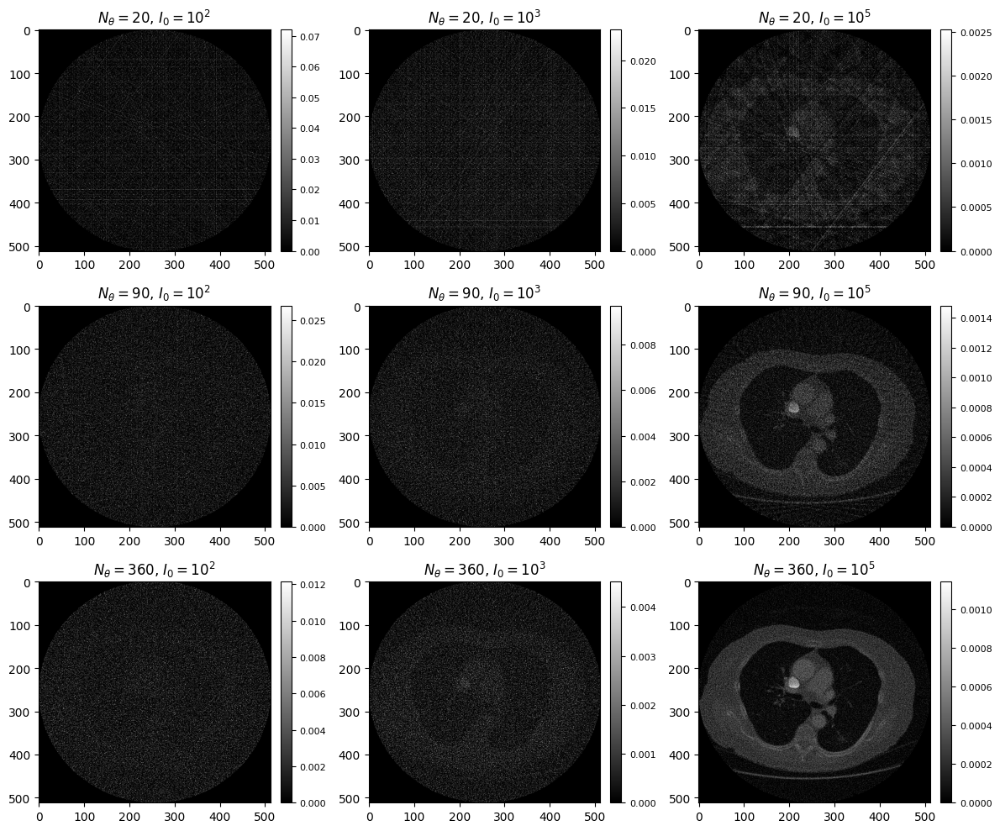

In [77]:
FBP_backprojection_dict = module_1.FBP_backprojection(noisy_sinogram_dict)
module_1.plot_sinogram_dict(FBP_backprojection_dict)

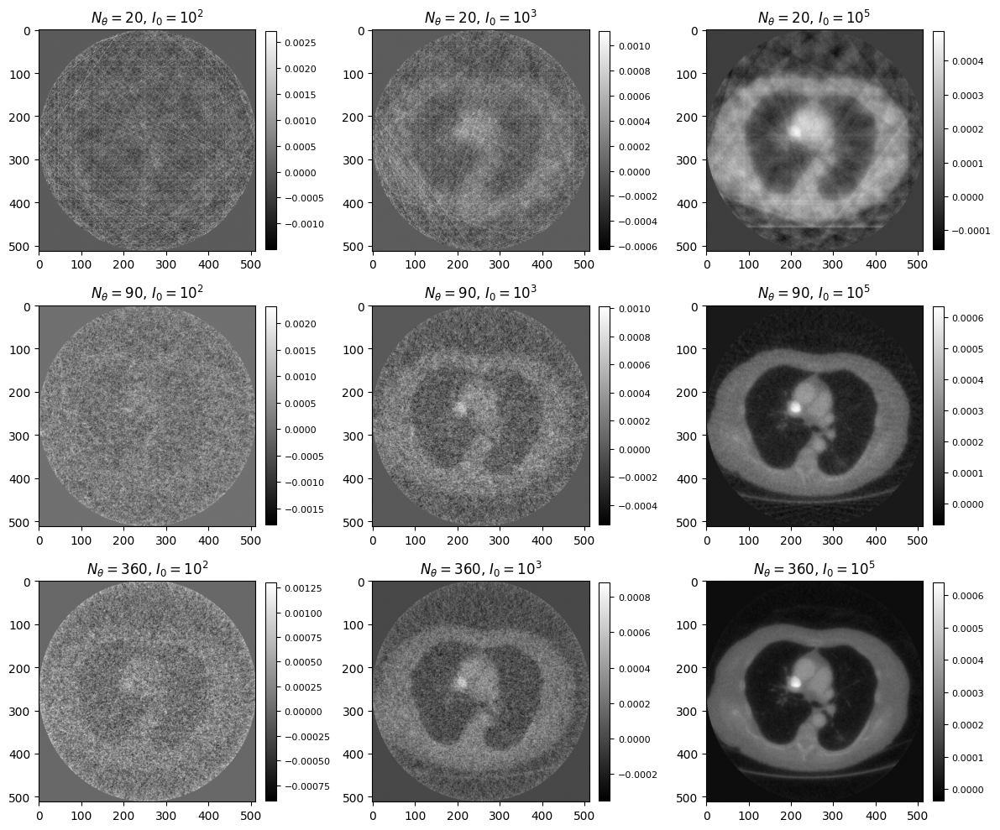

In [91]:
GD_backprojection_dict = module_1.GD_backprojection_compare(noisy_sinogram_dict)
module_1.plot_sinogram_dict(GD_backprojection_dict)

### Exercise 1.2 (a)

Sometimesduetomeasurementconstraints(e.g. arobotarminimageguidedsurgery)or
forscannerdesign(e.g. DigitalBreast Tomosynthesis).

Simulatenoisysinogramsat threedifferent angular ranges,180, 120, 40

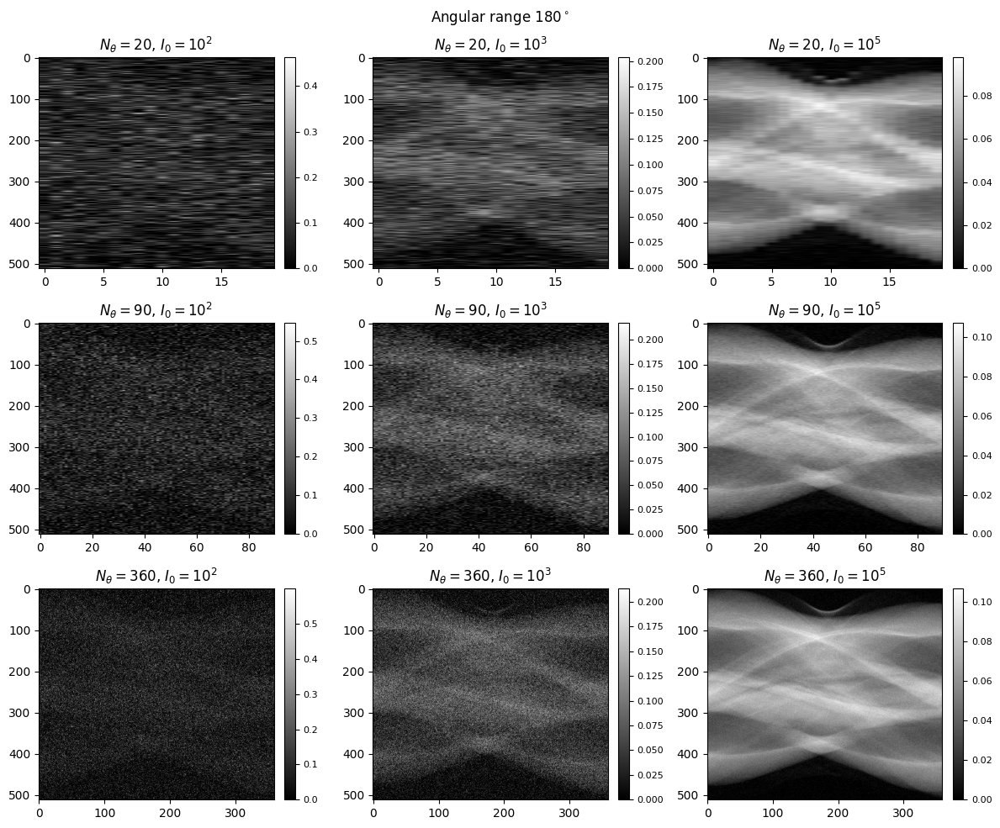

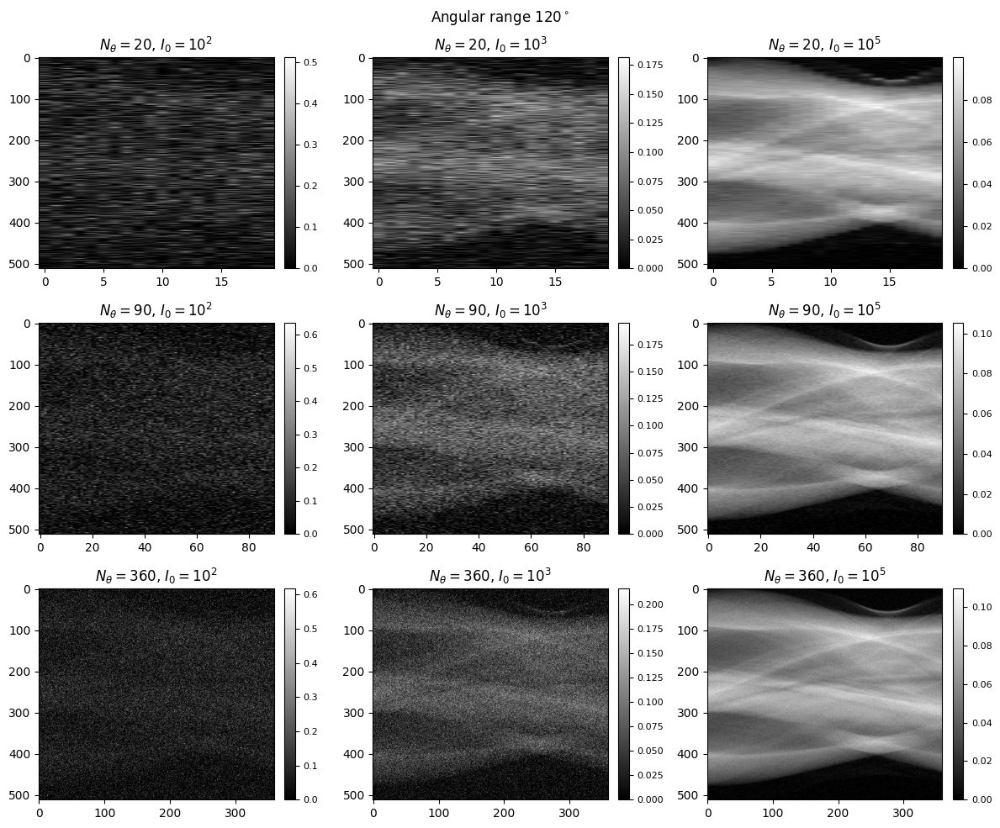

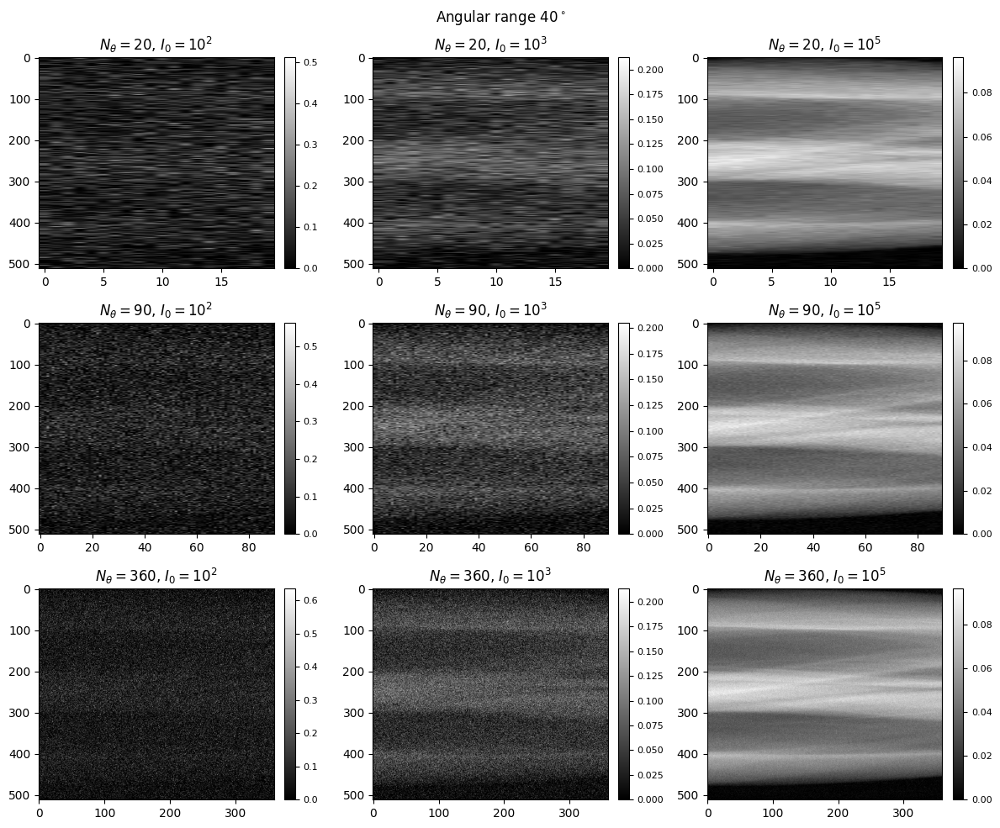

In [79]:
# 1.2a: noisy sinograms at three angular ranges 180°, 120°, 40°
for angle_range in [180, 120, 40]:
    limited_sinogram_dict = module_1.create_noisy_sinograms(image, angle_range=angle_range)
    module_1.plot_sinogram_dict(limited_sinogram_dict, suptitle=r'Angular range ${}^\circ$'.format(angle_range))

### Exercise 1.2 (b)

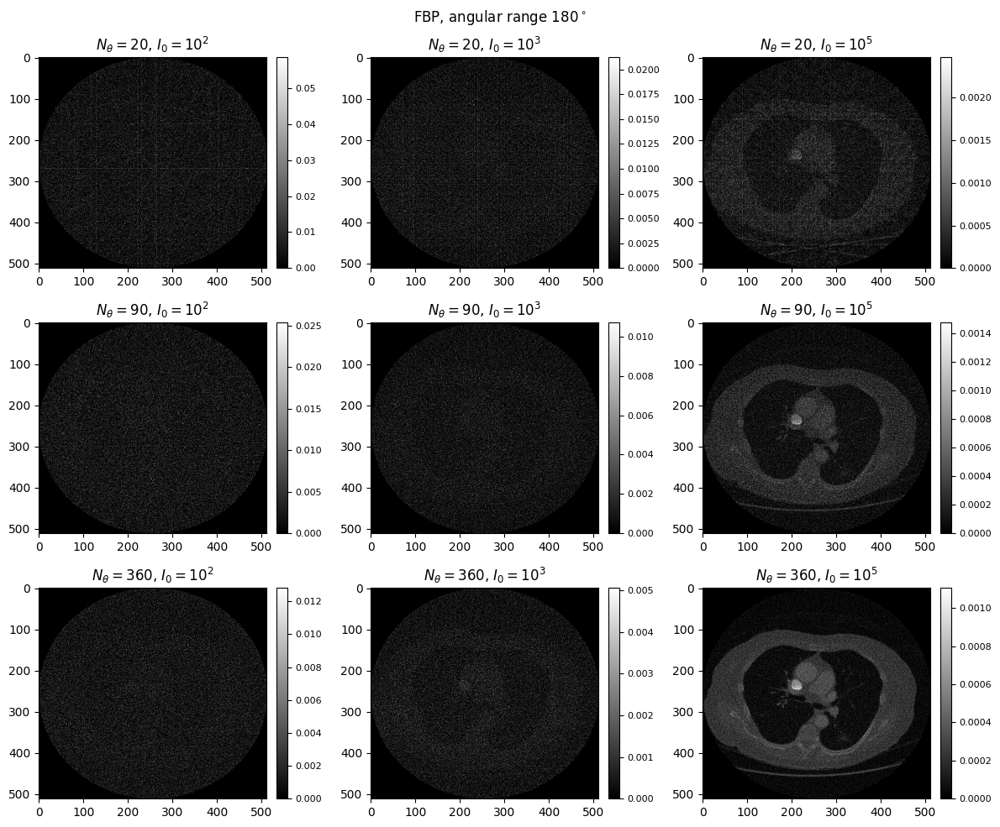

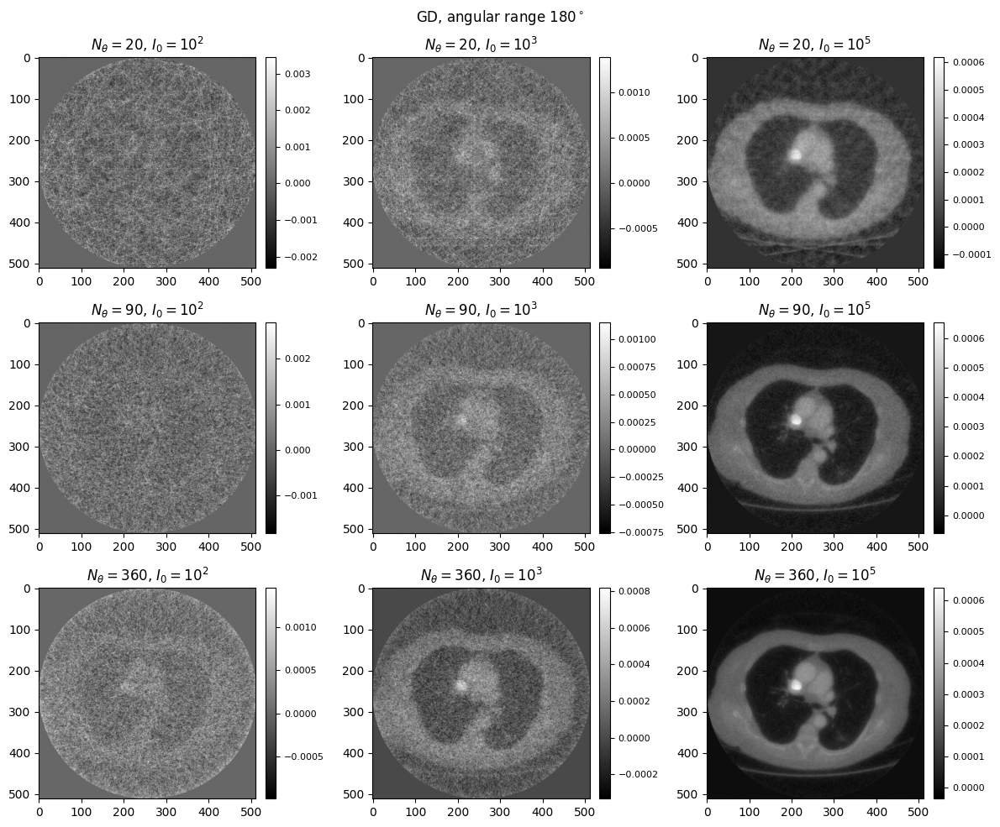

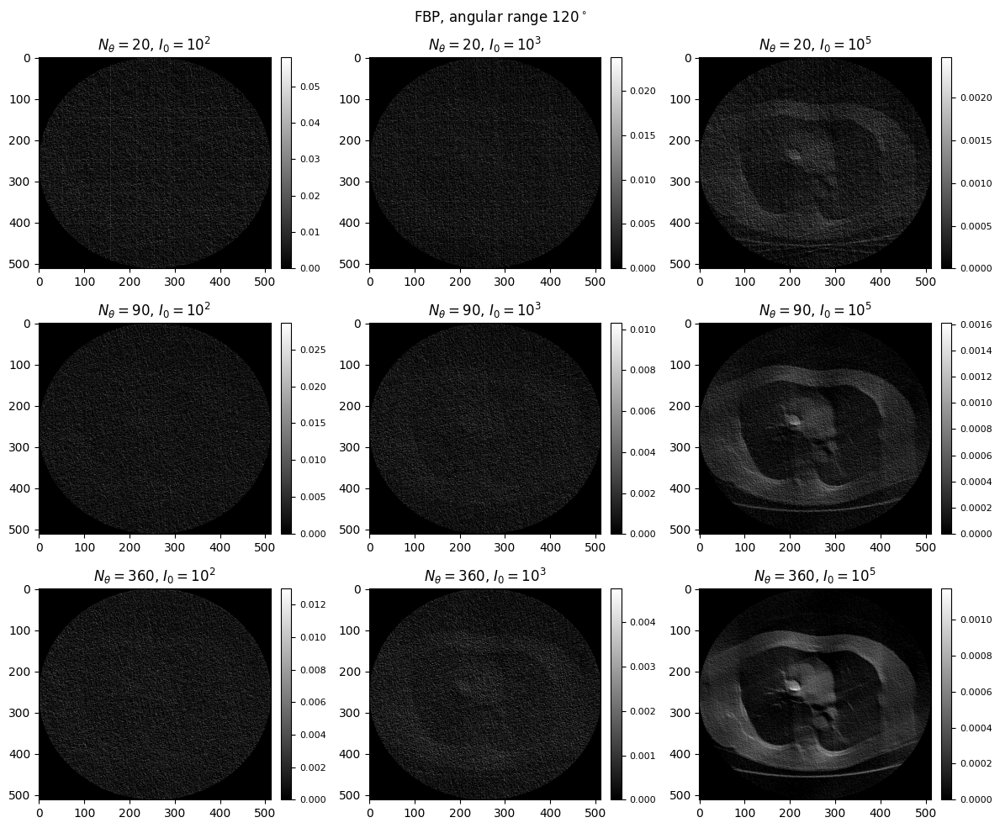

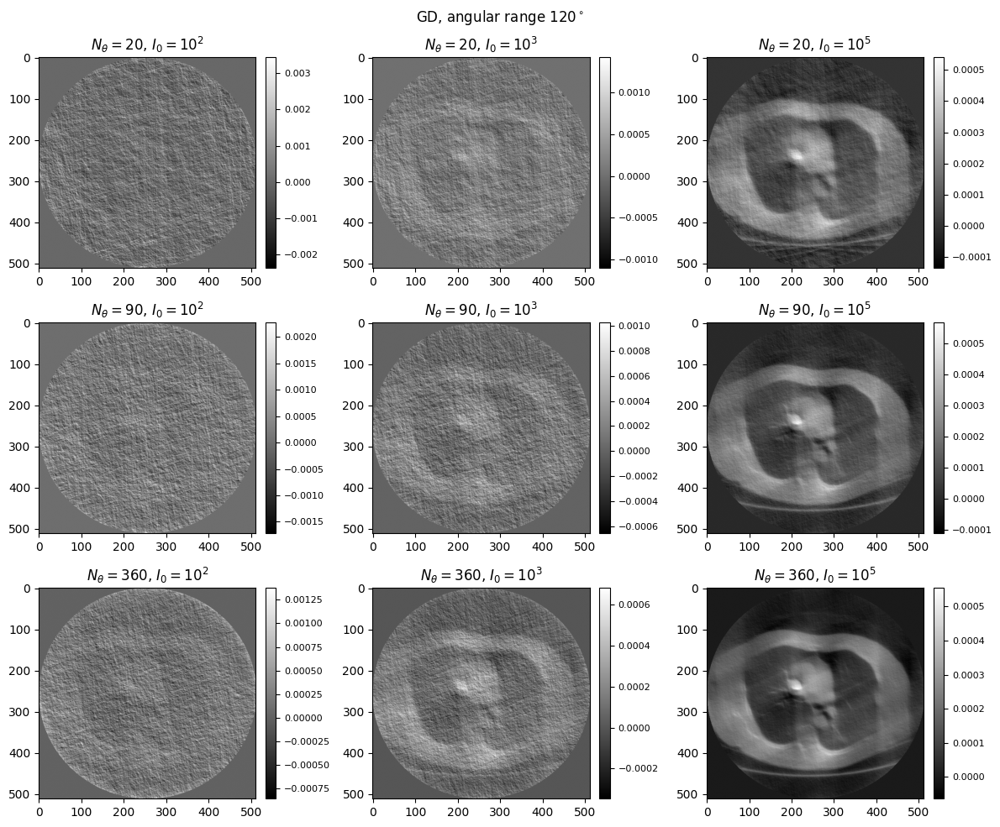

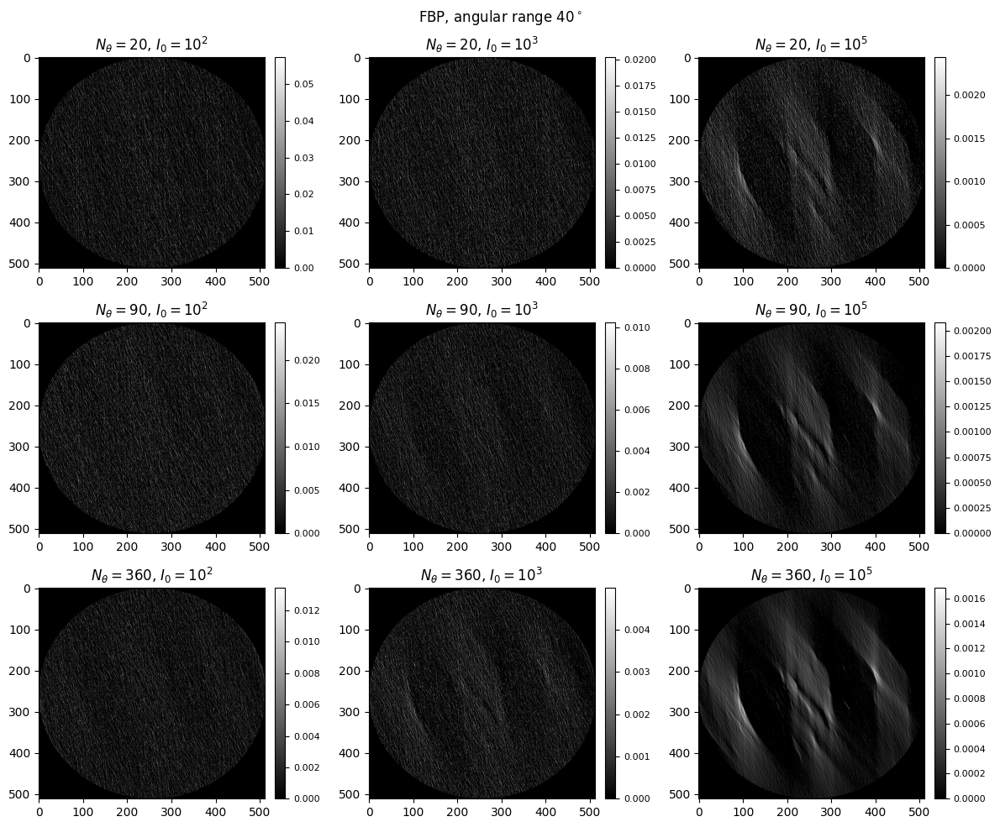

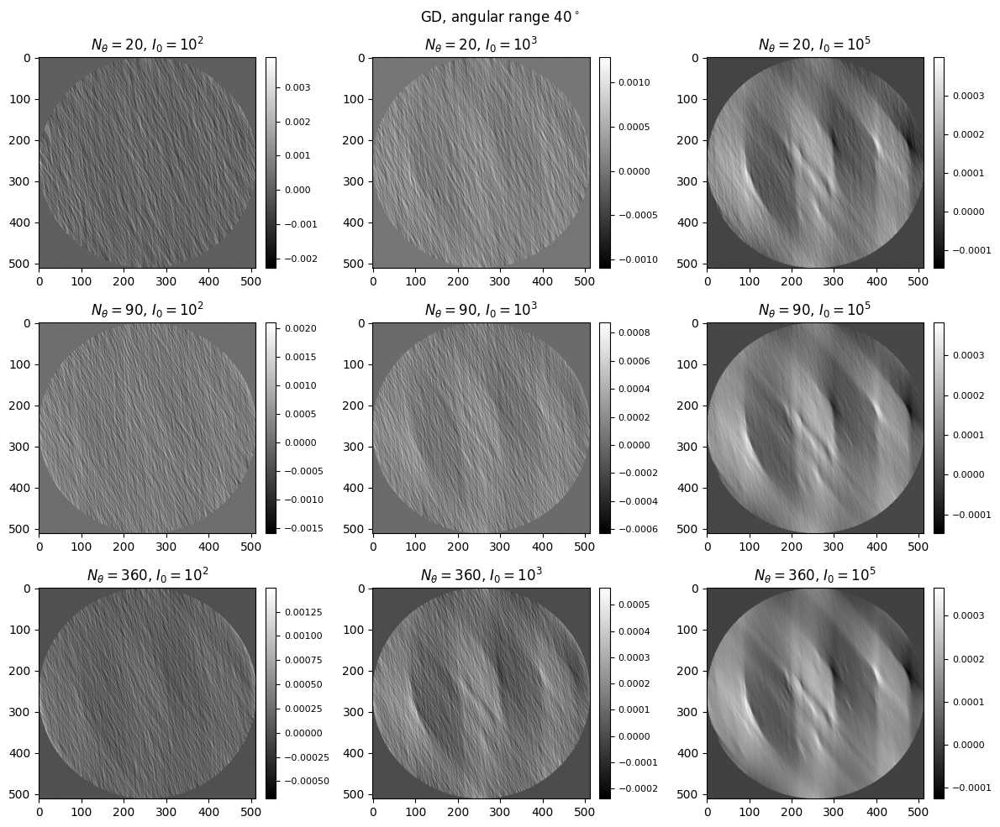

In [ ]:
# Repeat 1.1 experiment for each limited angle range: FBP and GD reconstructions
for angle_range in [180, 120, 40]:
    limited_sinogram_dict = module_1.create_noisy_sinograms(image, angle_range=angle_range)
    FBP_limited = module_1.FBP_backprojection(limited_sinogram_dict, angle_range=angle_range)
    module_1.plot_sinogram_dict(FBP_limited, suptitle=r'FBP, angular range ${}^\circ$'.format(angle_range))
    GD_limited = module_1.GD_backprojection_compare(limited_sinogram_dict, angle_range=angle_range)
    module_1.plot_sinogram_dict(GD_limited, suptitle=r'GD, angular range ${}^\circ$'.format(angle_range))

### Exercise 1.3 (a)

Shepp–Logan: ramp multiplied by a sinc window. This slightly rolls off high frequencies, reducing noise compared to pure Ram–Lak while keeping reasonably sharp edges.
Cosine: ramp multiplied by a cosine window. This more strongly suppresses high frequencies, giving smoother (less noisy) but more blurred reconstructions.

### Exercise 1.3 (b)

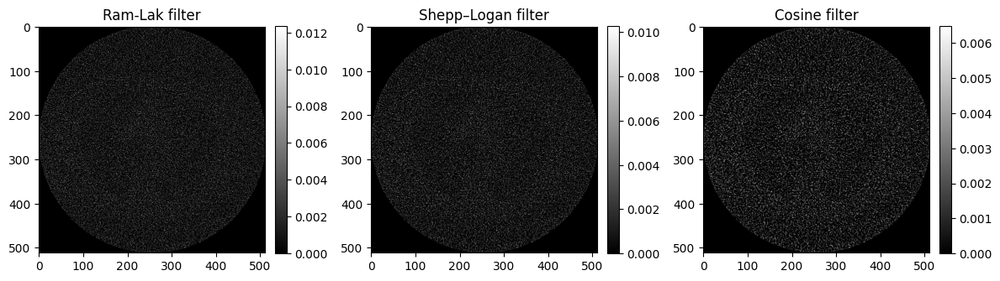

In [8]:
angles, I0 = 360, 1e2  # choose a low-dose example
reconstructions = module_1.FBP_compare_filters(noisy_sinogram_dict, angles=angles, I0=I0)
module_1.plot_filter_comparison(reconstructions)

### Exercise 1.3 (c)

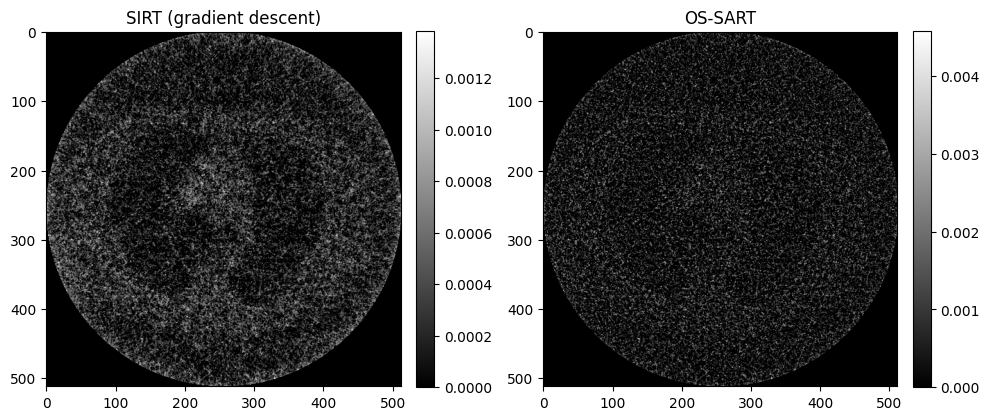

In [13]:
module_1.plot_compare_SIRT_OS_SART(noisy_sinogram_dict, angles=360, I0=1e2, angle_range=360, max_iter=50, gamma=0.001, n_subsets=5)

## Module 2

### Exercise 2.1 (a)

Coil dimension: 0 (axis 0)


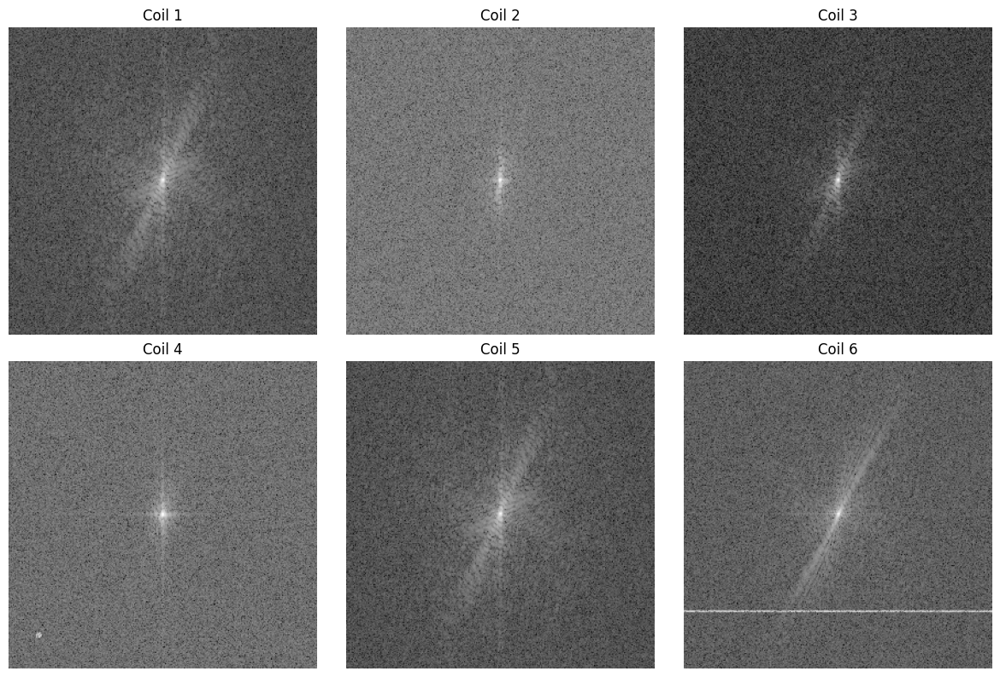

In [3]:
knee_data = module_2.load_kspace_data()
print("Coil dimension:", module_2.coil_dimension(knee_data), "(axis 0)")
kspace_mags = module_2.get_kspace_coil_mags(knee_data)
module_2.plot_kspace_coil_mags(kspace_mags)


### Exercise 2.1 (b)

### Exercise 2.1 (c)

Transform to image space; magnitude and phase from one coil.

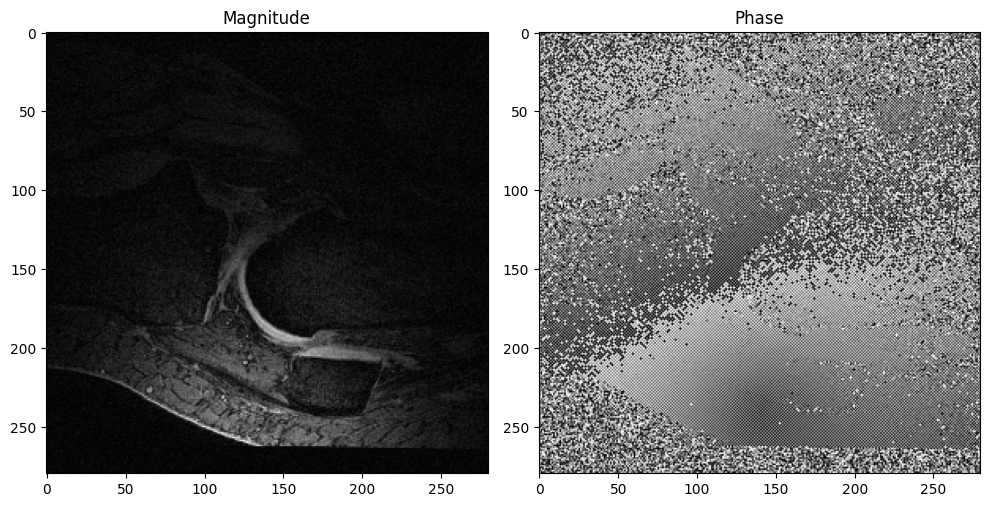

In [4]:
image_space = module_2.kspace_to_image_space(knee_data)
module_2.plot_one_coil_mag_phase(image_space[0])


### Exercise 2.1 (d)

Magnitude images from all coils (image space).

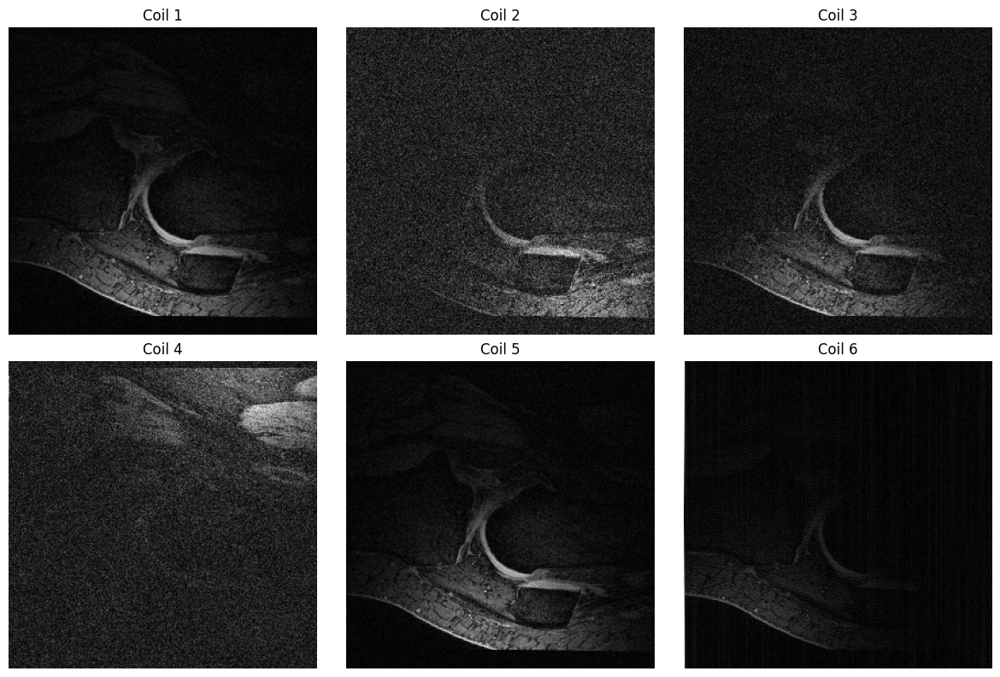

In [5]:
module_2.plot_all_coil_magnitudes(image_space)


### Exercise 2.1 (e)

Combine coils (root-sum-of-squares).

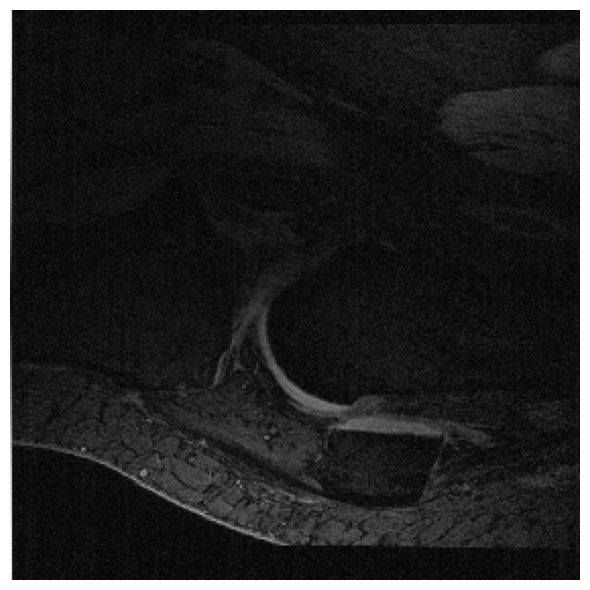

In [6]:
combined = module_2.combine_coils(image_space)
module_2.plot_combined(combined)


## Exercise 2.2 Removing noise

Choose three denoising methods using the image-space data and show the effects for all coils.


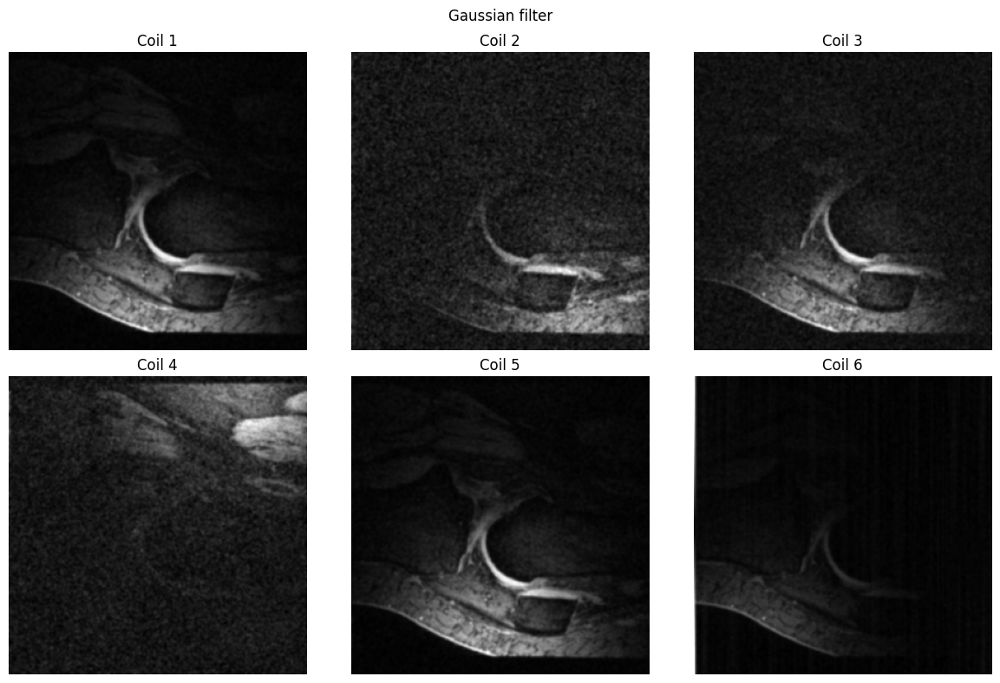

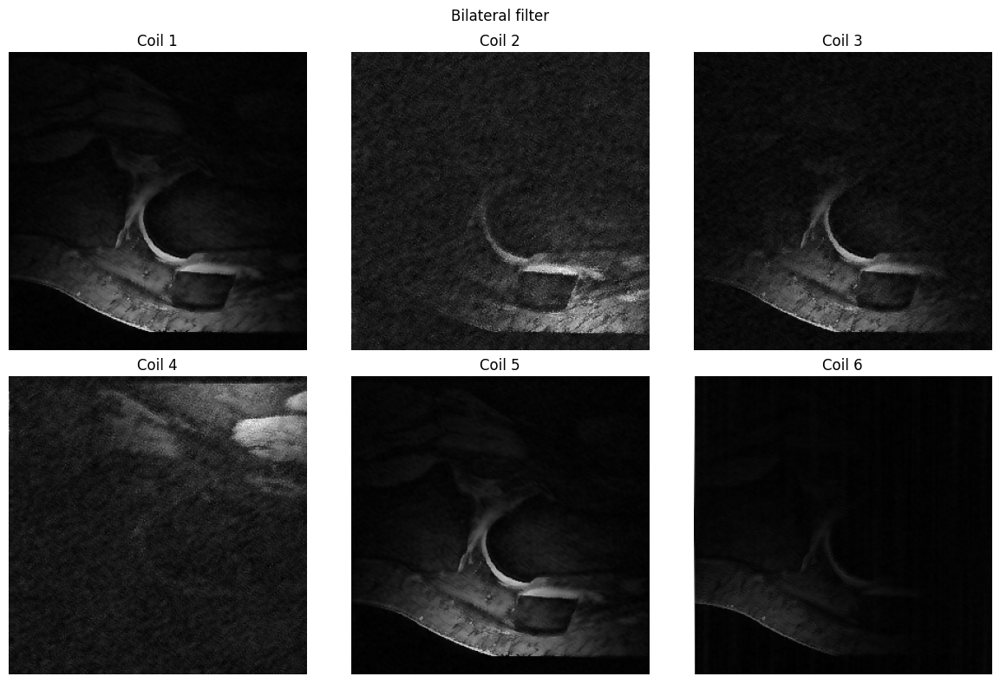

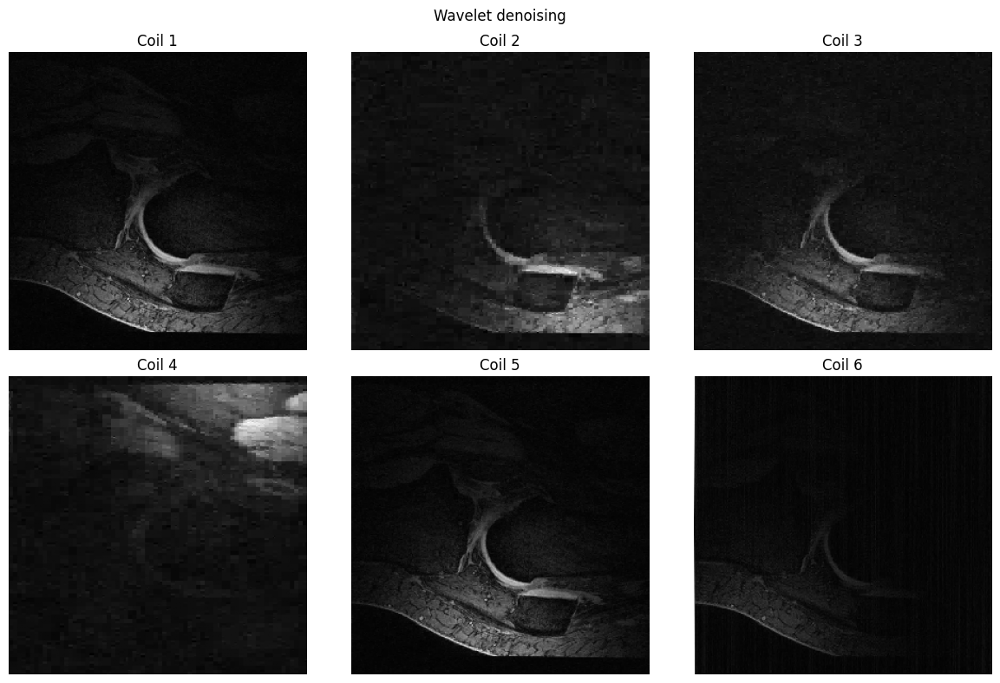

In [10]:
denoised_gaussian = module_2.denoise_coils_gaussian(image_space, sigma=1.0)
module_2.plot_denoised_coils(denoised_gaussian, title='Gaussian filter')

denoised_bilateral = module_2.denoise_coils_bilateral(image_space, sigma_spatial=1)
module_2.plot_denoised_coils(denoised_bilateral, title='Bilateral filter')

denoised_wavelet = module_2.denoise_coils_wavelet(image_space, method='BayesShrink')
module_2.plot_denoised_coils(denoised_wavelet, title='Wavelet denoising')


### Comments on denoising methods

- **Gaussian**: Smooths uniformly; reduces noise but blurs edges. Simple and fast.

- **Bilateral**: Edge-preserving; smooths flat regions but keeps edges sharper. Better for preserving anatomy at the cost of more computation.

- **Wavelet**: Separates signal into scales; removes small (noise-like) coefficients. Can preserve edges while reducing noise; choice of threshold (e.g. BayesShrink) affects result.


## Exercise 2.3 Butterworth and combined denoising\n
\n
Start from the original noisy k-space, apply a low-pass Butterworth filter to the first coil,\n
and compare to image-based denoising and combined-coil denoising.\n

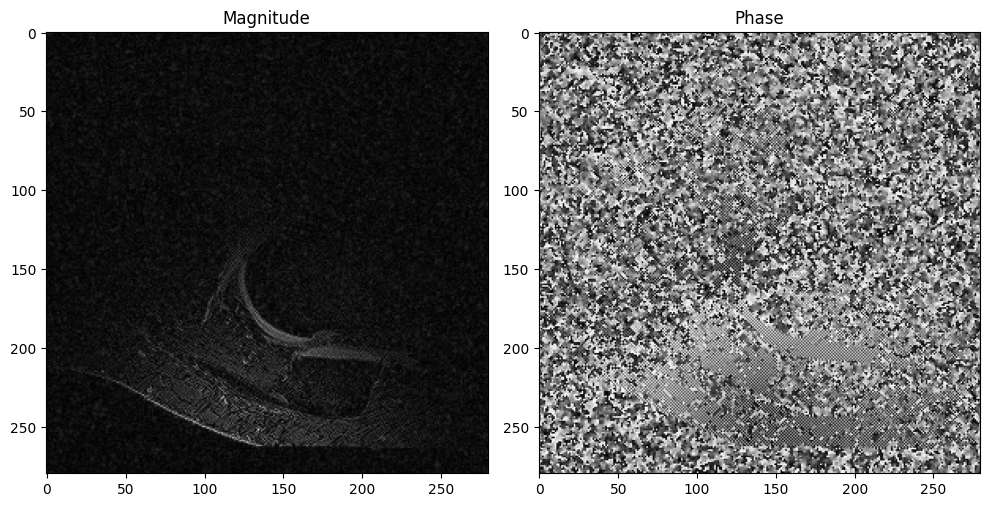

In [20]:
# Butterworth low-pass filter in k-space for first coil\n
butter_image = module_2.butterworth_first_coil_image(knee_data, D0=60, n=1)
module_2.plot_one_coil_mag_phase(butter_image)

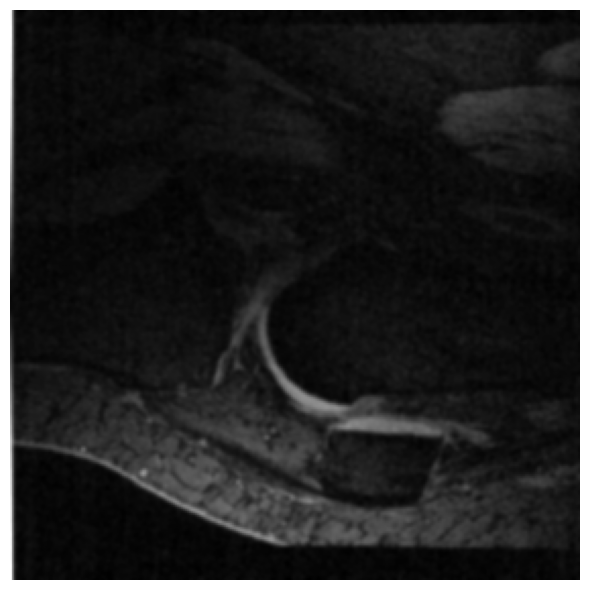

In [15]:
# Denoise the combined (root-sum-of-squares) image using Gaussian filter\n
denoised_combined = module_2.denoise_combined_gaussian(combined, sigma=1.0)
module_2.plot_combined(denoised_combined)

### Comparison of denoising methods\n
\n
- **Butterworth in k-space (first coil)**: Smooths high-frequency components directly in k-space.\n
  This reduces noise but can also blur fine detail and introduce ringing if the cutoff is too sharp.\n
\n
- **Image-based Gaussian / bilateral / wavelet (per-coil)**: Operate in image space, often giving\n
  more intuitive control. Gaussian blurs uniformly; bilateral and wavelet preserve edges better\n
  while still reducing background noise.\n
\n
- **Denoised combined image**: Applying a mild Gaussian filter to the combined (rSOS) image\n
  smooths residual noise while largely preserving structure. Stronger filtering (larger sigma)\n
  would reduce noise further but blur edges.\n
\n
Further improvements could use more advanced methods such as non-local means or total-variation\n
denoising on the combined image, or regularised reconstruction methods that incorporate noise\n
statistics during image formation.\n